<a href="https://colab.research.google.com/github/bosla67/Colab/blob/main/BuildingAssetTradingStrategy.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# **Building an Asset Trading Strategy**
https://www.kaggle.com/code/shtrausslearning/building-an-asset-trading-strategy/notebook

In [1]:
!pip install catboost
!pip install shap

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 98.7/98.7 MB 4.7 MB/s eta 0:00:00


In [3]:
# download data file
# ! wget https://transfer.sh/uWWDfzcAIY/data22.csv
# ! wget https://transfer.sh/U7TjAuGP2W/data22_2_1.csv

!wget https://oshi.at/mNZE
! pwd
! ls -la

--2025-02-25 10:34:29--  https://oshi.at/mNZE
Resolving oshi.at (oshi.at)... 194.15.112.248
Connecting to oshi.at (oshi.at)|194.15.112.248|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 88739959 (85M) [application/octet-stream]
Saving to: ‘mNZE’

mNZE                100%[===================>]  84.63M   271KB/s    in 3m 17s  

2025-02-25 10:37:47 (441 KB/s) - ‘mNZE’ saved [88739959/88739959]

/content
total 86704
drwxr-xr-x 1 root root     4096 Feb 25 10:34 .
drwxr-xr-x 1 root root     4096 Feb 25 10:06 ..
-rw-r--r-- 1 root root    21735 Feb 25 10:08 418258c6-d697-4409-aca7-f84efad697a1
drwxr-xr-x 4 root root     4096 Feb 21 14:21 .config
-rw-r--r-- 1 root root 88739959 Feb 25 10:33 mNZE
drwxr-xr-x 1 root root     4096 Feb 21 14:21 sample_data


In [ ]:
# from google.colab import drive
# drive.mount('/content/drive')

# ! pwd
# ! ls -la

# ! tar -xf ./drive/MyDrive/TS/2023/data_min1.tar.gz

Mounted at /content/drive
/content
total 20
drwxr-xr-x 1 root root 4096 Oct  8 15:19 .
drwxr-xr-x 1 root root 4096 Oct  8 15:14 ..
drwxr-xr-x 4 root root 4096 Oct  5 19:32 .config
drwx------ 5 root root 4096 Oct  8 15:19 drive
drwxr-xr-x 1 root root 4096 Oct  5 19:33 sample_data


In [1]:
import os
import numpy as np
import pandas as pd
import seaborn as sns;sns.set()
from plotly.subplots import make_subplots
import plotly.graph_objects as go
import plotly.express as px

import matplotlib.pyplot as plt
from matplotlib import cm
from pandas import read_csv, set_option
from sklearn.preprocessing import StandardScaler, MinMaxScaler, Normalizer,RobustScaler
from sklearn.model_selection import train_test_split, KFold, cross_val_score, GridSearchCV
from sklearn.linear_model import LogisticRegression
from sklearn.tree import DecisionTreeClassifier
from sklearn.neighbors import KNeighborsClassifier
from sklearn.discriminant_analysis import LinearDiscriminantAnalysis
from sklearn.naive_bayes import GaussianNB
from sklearn.svm import SVC
from sklearn.neural_network import MLPClassifier
from catboost import CatBoostClassifier,CatBoostRegressor
from sklearn.ensemble import RandomForestClassifier,RandomForestRegressor
from sklearn.feature_selection import SelectKBest,f_regression
from xgboost import plot_importance,XGBClassifier,XGBRegressor
from sklearn.model_selection import learning_curve
from sklearn.pipeline import Pipeline
from sklearn.ensemble import AdaBoostClassifier, GradientBoostingClassifier, RandomForestClassifier, ExtraTreesClassifier
from sklearn.metrics import classification_report, confusion_matrix, accuracy_score
from sklearn import preprocessing
import shap

from sklearn.decomposition import PCA
from sklearn.decomposition import SparsePCA
from sklearn.decomposition import KernelPCA
from sklearn.decomposition import IncrementalPCA
from sklearn.decomposition import TruncatedSVD
from sklearn.decomposition import MiniBatchDictionaryLearning
from sklearn.decomposition import FastICA
from sklearn.manifold import Isomap
from sklearn.manifold import MDS
from sklearn.manifold import LocallyLinearEmbedding
from sklearn.manifold import TSNE
from sklearn.random_projection import GaussianRandomProjection
from sklearn.random_projection import SparseRandomProjection

# for dirname, _, filenames in os.walk('/kaggle/'):
#     for filename in filenames:
#         print(os.path.join(dirname, filename))

import time
import warnings
warnings.filterwarnings('ignore')
sns.set(style='whitegrid')
%matplotlib inline

# time series cross validation
# https://hub.packtpub.com/cross-validation-strategies-for-time-series-forecasting-tutorial/

''' FUNCTIONS '''

# One plot type
def plot_line(ldf,lst,title='',sec_id=None,size=[350,1000]):

    # sec_id - list of [False,False,True] values of when to activate supblots; same length as lst

    if(sec_id is not None):
        fig = make_subplots(specs=[[{"secondary_y": True}]])
    else:
        fig = go.Figure()

    if(len(lst) is not 1):
        ii=-1
        for i in lst:
            ii+=1
            if(sec_id is not None):
                fig.add_trace(go.Scatter(x=ldf.index, y=ldf[lst[ii]],mode='lines',name=lst[ii],line=dict(width=2.0)),secondary_y=sec_id[ii])
            else:
                fig.add_trace(go.Scatter(x=ldf.index, y=ldf[lst[ii]],mode='lines',name=lst[ii],line=dict(width=2.0)))
    else:
        fig.add_trace(go.Scatter(x=ldf.index, y=ldf[lst[0]],mode='lines',name=lst[0],line=dict(width=2.0)))

    fig.update_layout(height=size[0],width=size[1],template='plotly_white',title=title,
                          margin=dict(l=50,r=80,t=50,b=40));fig.show()

# plot n verticle subplots
def plot_vsubplots(ldf,lst,title='',nplots=None,lw_id=None,size=[400,1000]):

    # lw_id list of line widths if added

    assert(nplots is not None)
    fig = make_subplots(rows=nplots,shared_xaxes=True)
    ii=-1
    for i in lst:
        ii+=1
        fig.add_trace(go.Scatter(x=ldf.index,y=ldf[lst[ii]], mode='lines',name=lst[ii],line=dict(width=lw_id[ii])), row=ii+1, col=1)

    fig.update_layout(height=size[0],width=size[1],template='plotly_white',title=title,
                          margin=dict(l=50,r=80,t=50,b=40));fig.show()

colours = ['tab:blue','tab:red','tab:green']
def plot_line2(ldf,lst,title=''):

    ii=-1
    plt.figure(figsize=(14,5))
    for i in lst:
        ii+=1
        ax = ldf[lst[ii]].plot(color=colours[ii],label=lst[ii],lw=1.5)
    plt.title(title)
    plt.legend();plt.show()

cmap = sns.diverging_palette(220, 10, as_cmap=True)

# Plot Correlation to Target Variable only
def corrMat(df,target='demand',figsize=(9,0.5),ret_id=False):

    corr_mat = df.corr().round(2);shape = corr_mat.shape[0]
    corr_mat = corr_mat.transpose()
    corr = corr_mat.loc[:, df.columns == target].transpose().copy()

    if(ret_id is False):
        f, ax = plt.subplots(figsize=figsize)
        sns.heatmap(corr,vmin=-0.3,vmax=0.3,center=0,
                     cmap=cmap,square=False,lw=2,annot=True,cbar=False)
        plt.title(f'Feature Correlation to {target}')

    if(ret_id):
        return corr

def bar_plot(x, y,palette_len,title='Missing Values (%)', xlim = None, ylim = None,
             xticklabels = None, yticklabels = None,xlabel = None, ylabel = None,
             figsize = (10,4),axis_grid = 'y'):

    cmap = sns.color_palette("plasma")
    fig, ax = plt.subplots(figsize = figsize)
    plt.title(title,size = 15, fontweight = 'bold')

    for i in ['top', 'right', 'bottom', 'left']:
        ax.spines[i].set_color('black')

    ax.spines['top'].set_visible(True);ax.spines['right'].set_visible(False)
    ax.spines['bottom'].set_visible(False);ax.spines['left'].set_visible(False)

    sns.barplot(x = x, y = y, edgecolor = 'black', ax = ax,
                palette = cmap)
    ax.set_xlim(xlim);ax.set_ylim(ylim)
    ax.set_xticklabels(xticklabels);ax.set_yticklabels(yticklabels)
    plt.xlabel(xlabel);plt.ylabel(ylabel)
    ax.grid(axis = axis_grid,ls='--',alpha = 0.9)
    plt.show()

# function to plot a two PCA Feature Plot using Pandas
def scatterPlot(xDF, yDF, algoName):

    sns.set_style('whitegrid')
    fig, ax = plt.subplots()
    tempDF = pd.DataFrame(data=xDF.loc[:,0:1], index=xDF.index)
    tempDF = pd.concat((tempDF,yDF), axis=1, join="inner")
    tempDF.columns = ["Component 1","Component 2","Label"]
    g = sns.scatterplot(x="Component 1",y="Component 2",data=tempDF,hue="Label",
                        linewidth=0.5,alpha=0.5,s=15,edgecolor='k')
    plt.title(algoName);plt.legend()

    for i in ['top', 'right', 'bottom', 'left']:
        ax.spines[i].set_color('black')

    ax.spines['top'].set_visible(False);ax.spines['right'].set_visible(False)
    ax.spines['bottom'].set_visible(False);ax.spines['left'].set_visible(False)
    ax.grid(axis = 'both',ls='--',alpha = 0.9)
    plt.show()


# reduce memory (@mfjwr1); distorts the data a little (but reduces by 60% memory)
def red_mem(df, verbose=True):
    numerics = ['int16', 'int32', 'int64', 'float16', 'float32', 'float64']
    start_mem = df.memory_usage().sum() / 1024**2
    for col in df.columns:
        col_type = df[col].dtypes
        if col_type in numerics:
            c_min = df[col].min()
            c_max = df[col].max()
            if str(col_type)[:3] == 'int':
                if c_min > np.iinfo(np.int8).min and c_max < np.iinfo(np.int8).max:
                    df[col] = df[col].astype(np.int8)
                elif c_min > np.iinfo(np.int16).min and c_max < np.iinfo(np.int16).max:
                    df[col] = df[col].astype(np.int16)
                elif c_min > np.iinfo(np.int32).min and c_max < np.iinfo(np.int32).max:
                    df[col] = df[col].astype(np.int32)
                elif c_min > np.iinfo(np.int64).min and c_max < np.iinfo(np.int64).max:
                    df[col] = df[col].astype(np.int64)
            else:
                if c_min > np.finfo(np.float16).min and c_max < np.finfo(np.float16).max:
                    df[col] = df[col].astype(np.float16)
                elif c_min > np.finfo(np.float32).min and c_max < np.finfo(np.float32).max:
                    df[col] = df[col].astype(np.float32)
                else:
                    df[col] = df[col].astype(np.float64)

    end_mem = df.memory_usage().sum() / 1024**2
    print('Memory usage after optimization is: {:.2f} MB'.format(end_mem))
    print('Decreased by {:.1f}%'.format(100 * (start_mem - end_mem) / start_mem))

    return df

# Split for TimeSeries
def TimeSeries_Split(ldf,
                     split_id=[None,None],
                     test_id=False,
                     cut_id=None):

    # Reduce the number of used data
    if(cut_id is not None):
        print('Reducing Input Data')

        if(type(cut_id) is int):
            ldf = ldf.iloc[-cut_id:]
        else:
            # input anything other than int
            print('Slicing based on period')
            ldf = ldf[data_period]

        t1 = ldf.index.max();t0 = ldf.index.min()
        print(f'Dataset Min.Index: {t0} | Max.Index: {t1}')

    if(split_id[0] is not None):
        # General Percentage Split (Non Shuffle requied for Time Series)
        train_df,pred_df = train_test_split(ldf,test_size=split_id[0],shuffle=False)
    elif(split_id[1] is not None):
        # specific time split
        train_df = df.loc[:split_id[1]]; pred_df = df.loc[split_id[1]:]
    else:
        print('Choose One Splitting Method Only')

#     y_train = train_df[feature]
#     X_train = train_df.loc[:, train_df.columns != feature]
#     if(test_id):
#         y_test = pred_df[feature]
#         X_test = pred_df.loc[:, pred_df.columns != feature]

    return train_df,pred_df # return

<>:71: SyntaxWarning: "is not" with a literal. Did you mean "!="?
<>:71: SyntaxWarning: "is not" with a literal. Did you mean "!="?


In [5]:
!mv ./mNZE ./data22_2_1.csv

In [3]:
df1 = pd.read_csv('./data22_2_1.csv', delimiter='\t',index_col='Date_t')
# df = df.set_index('Date_t')

In [ ]:
# # It's possible to reduce the dataframe memory by 62% (if you need)
# red_df = red_mem(df)
# red_df.info()

Вибираєм таймфрейм по якому буде проводитись перевірка результатів

In [26]:
df=df1.iloc[:int(len(df1)/8)]

In [7]:
df.Result.value_counts()/len(df)

,count
Result,
1.0,0.520143
0.0,0.479857


In [7]:

# ! ls -la
! head ./data22_2_1.csv


Date_t	Open	High	Low	Close	Volume	mom0	mom1	mom2	rsi0	rsi1	rsi2	sth0k	sth1k	sth2k	sth0d	sth1d	sth2d	ema0	ema1	ema2	tema0	tema1	tema2	ama0	ama1	ama2	Result
2022.11.30 23:58	1.040460	1.040470	1.040460	1.040470	2.000000	100.00	99.98	99.97	47.40	45.08	45.78	88.00	28.87	26.80	74.29	26.33	26.80	1.040458	1.040484	1.040509	1.040466	1.040422	1.040419	1.040504	1.040548	1.040603	0
2022.12.01 00:07	1.040500	1.040540	1.040500	1.040510	7.000000	100.01	99.98	99.99	58.76	48.83	47.82	83.87	35.88	30.72	79.08	31.11	30.72	1.040475	1.040488	1.040509	1.040502	1.040453	1.040437	1.040505	1.040545	1.040602	0
2022.12.01 00:08	1.040490	1.040490	1.040460	1.040470	5.000000	100.00	100.01	99.99	46.27	45.39	45.97	72.97	48.04	32.03	76.03	39.57	32.03	1.040474	1.040485	1.040504	1.040488	1.040457	1.040438	1.040503	1.040536	1.040600	0
2022.12.01 00:09	1.040470	1.040470	1.040190	1.040250	10.000000	99.98	99.99	99.96	18.80	31.72	37.44	39.06	41.24	24.10	57.55	40.40	24.10	1.040399	1.040442	1.040472	1.040326	1.040361	1.040368	1

In [27]:
display(df['Result'].value_counts())

# print()

# df1['signal'] = np.where(df1['result'] == 0 , -1.0, np.where(df1['result'] < 7 , 0.0, 1.0)) # Create signals
# df1 = df1.drop(columns=['result'])
# display(df1['signal'].value_counts())



,count
Result,
1.0,25939
0.0,23930


In [28]:
# df_tr,df_te = TimeSeries_Split(df,split_id=[0.2,None], #  Train/Test Split (0.8/0.2)
#                                cut_id=data_period)     # Use only 100,000 data points

df_tr,df_te = TimeSeries_Split(df,split_id=[0.2,None]) #  Train/Test Split (0.8/0.2)
                              #  cut_id=data_period)     # Use only 100,000 data points


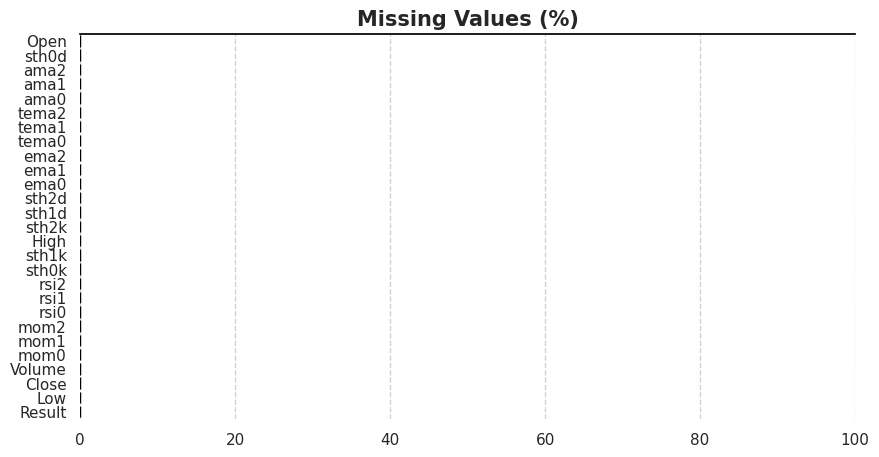

In [10]:
NaN_values = (df_tr.isnull().sum()/len(df_tr)*100).sort_values(ascending = False)

# Plot missing data
bar_plot(x = NaN_values,y = NaN_values.index,palette_len = NaN_values.index,
         xlim = (0,100),xticklabels = range(0,101,20),yticklabels = NaN_values.index,
         figsize = (10,5), axis_grid = 'x')

In [11]:
df_tr[df_tr.isna().any(axis=1)]

,Open,High,Low,Close,Volume,mom0,mom1,mom2,rsi0,rsi1,...,ema0,ema1,ema2,tema0,tema1,tema2,ama0,ama1,ama2,Result
Date_t,,,,,,,,,,,,,,,,,,,,,


In [ ]:
# def forward_fill_na(ldf):
#     # ldf['Volume_(BTC)'].fillna(0, inplace=True)
#     # ldf['Volume_(Currency)'].fillna(0, inplace=True)
#     # ldf['Weighted_Price'].fillna(0, inplace=True)
#     ldf['Open'].fillna(method='ffill', inplace=True)
#     ldf['High'].fillna(method='ffill', inplace=True)
#     ldf['Low'].fillna(method='ffill', inplace=True)
#     ldf['Close'].fillna(method='ffill', inplace=True)

# forward_fill_na(df_tr)  # modification of training set
# forward_fill_na(df_te) # modification of test set


In [12]:
df = df.drop_duplicates(keep=False,inplace=True)
df_tr = df_tr.dropna()
df_te = df_te.dropna()     # replicate on test set

In [29]:
set_option('display.precision',5)
df_tr.describe()

,Open,High,Low,Close,Volume,mom0,mom1,mom2,rsi0,rsi1,...,ema0,ema1,ema2,tema0,tema1,tema2,ama0,ama1,ama2,Result
count,39895.00000,39895.00000,39895.00000,39895.00000,39895.00000,39895.00000,39895.00000,39895.00000,39895.00000,39895.00000,...,39895.00000,39895.00000,39895.00000,39895.00000,39895.00000,39895.00000,39895.00000,39895.00000,39895.00000,39895.00000
mean,1.05976,1.05986,1.05965,1.05976,63.47871,100.00040,100.00081,100.00123,50.46883,50.42057,...,1.05976,1.05975,1.05975,1.05976,1.05976,1.05976,1.05975,1.05975,1.05975,0.52212
std,0.00707,0.00707,0.00708,0.00707,50.71996,0.03879,0.05416,0.06606,19.71924,13.89507,...,0.00707,0.00707,0.00707,0.00707,0.00707,0.00708,0.00707,0.00707,0.00707,0.49952
min,1.03973,1.04005,1.03930,1.03970,1.00000,99.13000,99.11000,99.11000,0.60000,4.00000,...,1.04006,1.04013,1.04018,1.03981,1.03971,1.03980,1.04010,1.04013,1.04018,0.00000
25%,1.05381,1.05393,1.05369,1.05380,31.00000,99.98000,99.98000,99.97000,35.92000,40.86500,...,1.05380,1.05380,1.05379,1.05380,1.05381,1.05382,1.05380,1.05379,1.05378,0.00000
50%,1.06113,1.06122,1.06103,1.06113,52.00000,100.00000,100.00000,100.00000,50.44000,50.36000,...,1.06113,1.06113,1.06113,1.06113,1.06113,1.06113,1.06113,1.06113,1.06117,1.00000
75%,1.06450,1.06460,1.06441,1.06450,82.00000,100.02000,100.03000,100.03000,64.98000,60.05000,...,1.06450,1.06449,1.06449,1.06450,1.06450,1.06450,1.06451,1.06450,1.06448,1.00000
max,1.07594,1.07605,1.07572,1.07594,579.00000,100.85000,100.85000,100.94000,99.97000,99.71000,...,1.07580,1.07571,1.07559,1.07588,1.07591,1.07595,1.07551,1.07539,1.07526,1.00000


In [30]:
df_tr.info()

<class 'pandas.core.frame.DataFrame'>
Index: 39895 entries, 2022.11.30 23:58 to 2023.01.11 02:50
Data columns (total 27 columns):
 #   Column  Non-Null Count  Dtype  
---  ------  --------------  -----  
 0   Open    39895 non-null  float64
 1   High    39895 non-null  float64
 2   Low     39895 non-null  float64
 3   Close   39895 non-null  float64
 4   Volume  39895 non-null  float64
 5   mom0    39895 non-null  float64
 6   mom1    39895 non-null  float64
 7   mom2    39895 non-null  float64
 8   rsi0    39895 non-null  float64
 9   rsi1    39895 non-null  float64
 10  rsi2    39895 non-null  float64
 11  sth0k   39895 non-null  float64
 12  sth1k   39895 non-null  float64
 13  sth2k   39895 non-null  float64
 14  sth0d   39895 non-null  float64
 15  sth1d   39895 non-null  float64
 16  sth2d   39895 non-null  float64
 17  ema0    39895 non-null  float64
 18  ema1    39895 non-null  float64
 19  ema2    39895 non-null  float64
 20  tema0   39895 non-null  float64
 21  tema1   39895 

In [31]:
df_tr

,Open,High,Low,Close,Volume,mom0,mom1,mom2,rsi0,rsi1,...,ema0,ema1,ema2,tema0,tema1,tema2,ama0,ama1,ama2,Result
Date_t,,,,,,,,,,,,,,,,,,,,,
2022.11.30 23:58,1.04046,1.04047,1.04046,1.04047,2.0,100.00,99.98,99.97,47.40,45.08,...,1.04046,1.04048,1.04051,1.04047,1.04042,1.04042,1.04050,1.04055,1.04060,0.0
2022.12.01 00:07,1.04050,1.04054,1.04050,1.04051,7.0,100.01,99.98,99.99,58.76,48.83,...,1.04048,1.04049,1.04051,1.04050,1.04045,1.04044,1.04051,1.04055,1.04060,0.0
2022.12.01 00:08,1.04049,1.04049,1.04046,1.04047,5.0,100.00,100.01,99.99,46.27,45.39,...,1.04047,1.04049,1.04050,1.04049,1.04046,1.04044,1.04050,1.04054,1.04060,0.0
2022.12.01 00:09,1.04047,1.04047,1.04019,1.04025,10.0,99.98,99.99,99.96,18.80,31.72,...,1.04040,1.04044,1.04047,1.04033,1.04036,1.04037,1.04045,1.04052,1.04057,0.0
2022.12.01 00:10,1.04025,1.04029,1.04022,1.04023,24.0,99.98,99.98,99.94,17.61,30.78,...,1.04034,1.04040,1.04044,1.04024,1.04029,1.04031,1.04041,1.04048,1.04050,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2023.01.11 02:46,1.07426,1.07431,1.07426,1.07429,21.0,100.01,100.04,100.01,85.10,69.03,...,1.07424,1.07418,1.07414,1.07429,1.07430,1.07427,1.07425,1.07420,1.07402,1.0
2023.01.11 02:47,1.07429,1.07432,1.07425,1.07431,35.0,100.01,100.03,100.01,86.92,70.38,...,1.07426,1.07420,1.07416,1.07431,1.07432,1.07430,1.07428,1.07425,1.07403,1.0
2023.01.11 02:48,1.07431,1.07431,1.07426,1.07426,24.0,100.00,100.02,100.03,62.84,62.78,...,1.07426,1.07421,1.07418,1.07428,1.07431,1.07431,1.07428,1.07425,1.07407,0.0


In [16]:
plot_vsubplots(df_tr,['Close','Result'],
               title='Weighted Price & Signal Fluctional in Training Data',
               nplots=2,
               lw_id=[2,0.4],
               size=[500,1000])

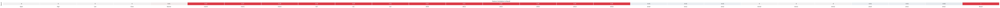

In [32]:
corrMat(df_tr,'Result',figsize=(170,0.5)) # Baseline Dataframe feature correlation to Signal

In [33]:
df_tr.info()

<class 'pandas.core.frame.DataFrame'>
Index: 39895 entries, 2022.11.30 23:58 to 2023.01.11 02:50
Data columns (total 27 columns):
 #   Column  Non-Null Count  Dtype  
---  ------  --------------  -----  
 0   Open    39895 non-null  float64
 1   High    39895 non-null  float64
 2   Low     39895 non-null  float64
 3   Close   39895 non-null  float64
 4   Volume  39895 non-null  float64
 5   mom0    39895 non-null  float64
 6   mom1    39895 non-null  float64
 7   mom2    39895 non-null  float64
 8   rsi0    39895 non-null  float64
 9   rsi1    39895 non-null  float64
 10  rsi2    39895 non-null  float64
 11  sth0k   39895 non-null  float64
 12  sth1k   39895 non-null  float64
 13  sth2k   39895 non-null  float64
 14  sth0d   39895 non-null  float64
 15  sth1d   39895 non-null  float64
 16  sth2d   39895 non-null  float64
 17  ema0    39895 non-null  float64
 18  ema1    39895 non-null  float64
 19  ema2    39895 non-null  float64
 20  tema0   39895 non-null  float64
 21  tema1   39895 

In [ ]:
# df_tr = df_tr.drop(columns=['Open', 'High', 'Low', 'Close', 'Volume', 'ama0_1h', 'ama0_15', 'ama0_5',
#                             'bb_ama0_1h0', 'bb_ama0_1h1', 'bb_ama0_1h2', 'bb_ama0_1h3', 'bb_ama0_1h4',
#                             'bb_ama0_15m0', 'bb_ama0_15m1', 'bb_ama0_15m2', 'bb_ama0_15m3', 'bb_ama0_15m4',
#                             'bb_ama0_5m1', 'bb_ama0_5m2', 'bb_ama0_5m3', 'bb_ama0_5m4',
#                             'bb_ama1_1h0', 'bb_ama1_1h1', 'bb_ama1_1h2', 'bb_ama1_1h3', 'bb_ama1_1h4',
#                             'bb_ama1_15m0', 'bb_ama1_15m1', 'bb_ama1_15m2', 'bb_ama1_15m3', 'bb_ama1_15m4',
#                             'bb_ama1_5m1', 'bb_ama1_5m2', 'bb_ama1_5m3', 'bb_ama1_5m4',
#                             'bb_ama2_1h0', 'bb_ama2_1h1', 'bb_ama2_1h2', 'bb_ama2_1h3', 'bb_ama2_1h4',
#                             'bb_ama2_15m0', 'bb_ama2_15m1', 'bb_ama2_15m2', 'bb_ama2_15m3', 'bb_ama2_15m4',
#                             'bb_ama2_5m1', 'bb_ama2_5m2', 'bb_ama2_5m3', 'bb_ama2_5m4',
#                             'bb_ama3_1h0', 'bb_ama3_1h1', 'bb_ama3_1h2', 'bb_ama3_1h3', 'bb_ama3_1h4',
#                             'bb_ama3_15m0', 'bb_ama3_15m1', 'bb_ama3_15m2', 'bb_ama3_15m3', 'bb_ama3_15m4',
#                             'bb_ama3_5m1', 'bb_ama3_5m2', 'bb_ama3_5m3', 'bb_ama3_5m4',
#                             'bb_tema2_1h0', 'bb_tema2_1h1', 'bb_tema2_1h2', 'bb_tema2_1h3', 'bb_tema2_1h4',
#                             'bb_tema3_1h0', 'bb_tema3_1h1', 'bb_tema3_1h2', 'bb_tema3_1h3', 'bb_tema3_1h4'])

In [34]:
models = []
# Lightweight Models
models.append(('LDA', LinearDiscriminantAnalysis()))  # Unsupervised Model
models.append(('KNN', KNeighborsClassifier()))  # Unsupervised Model
models.append(('TREE', DecisionTreeClassifier())) # Supervised Model
models.append(('NB', GaussianNB())) # Unsupervised Model

# More Advanced Models
models.append(('GBM', GradientBoostingClassifier(n_estimators=55)))
models.append(('XGB',XGBClassifier(n_estimators=55,eval_metric='logloss')))
models.append(('CAT',CatBoostClassifier(silent=True,
                                        n_estimators=55)))
models.append(('RF', RandomForestClassifier(n_estimators=55)))


In [35]:
# eval_id (T/F): [CV,Train,Test,all]

def modelEval(ldf,feature='Result',split_id=[None,None],eval_id=[True,True,True,True],
              n_fold=5,scoring='accuracy',plot_id=[False,True],cv_yrange=None,hm_vvals=[0.5,1.0,0.75]):

    print('Evaluation Function')
    print(f'Cross Validation Activated, n_splits : {n_fold}, scoring metric: {scoring}')
    if(eval_id[2]):
        if(split_id[0] is not None):
            print(f'Train/Evaluation Set Spit Activated: {split_id[0]}')
        if(split_id[1] is not None):
            print(f'Train/Evaluation Set Split made at {split_id[1]}')

    ''' 1. Split Train/Evaluation <DataFrame> Set Split '''

    # split_id : Train/Test split [%,timestamp], whichever is not None
    # test_id : Evaluate trained model on test set only

    if(split_id[0] is not None):
        # General Percentage Split (Non Shuffle requied for Time Series)
        train_df,eval_df = train_test_split(ldf,test_size=split_id[0],shuffle=False)
    elif(split_id[1] is not None):
        # specific time split
        train_df = df.loc[:split_id[1]]; eval_df = df.loc[split_id[1]:]
    else:
        print('Choose One Splitting Method Only')

    ''' 2. Train/Test Feature Matrices + Target Variables Split'''

    y_train = train_df[feature]
    X_train = train_df.loc[:, train_df.columns != feature]
    y_eval = eval_df[feature]
    X_eval = eval_df.loc[:, eval_df.columns != feature]
    X_one = pd.concat([X_train,X_eval],axis=0)
    y_one = pd.concat([y_train,y_eval],axis=0)

    print('');print(f'Using Features: {X_train.columns}')
    print(f'Target Variable: {feature}');print('')

    ''' 3. Visualise Training/Test Data'''
    if(plot_id[0]):

        # plot the training data
        fig = go.Figure()
        fig.add_trace(go.Scatter(x=train_df.index, y=train_df['signal'],mode='lines',name='Training Data', line={'width': 0.25}))
        fig.update_layout(height=300,width=800,template='plotly_white',title='Training Signal Visualisation',
                          margin=dict(l=50,r=80,t=50,b=40))

        # Plot the test data as well
        if(eval_id[2]):
            fig.add_trace(go.Scatter(x=eval_df.index, y=eval_df['signal'],mode='lines',name='Test Data',line={'width': 0.25}))
            fig.update_layout(title='Training/Test Signal Visualisation')
        fig.show()

    ''' 4. Cross Validation, Training/Evaluation, one evaluation'''
    lst_res = []; names = []; lst_train = []; lst_eval = []; lst_one = []; lst_res_mean = []
    if(any(eval_id)):
        for name, model in models:  # cycle through models & evaluate either cv or train/test
            names.append(name)

            # Cross Validation Model on Training Se
            if(eval_id[0]):
                t0=time.time()
                kfold = KFold(n_splits=n_fold)
                cv_res = cross_val_score(model,X_train,y_train, cv=kfold, scoring=scoring)
                t1 = time.time()
                lst_res.append(cv_res)
                tt1 = t1-t0 # total time for n_fold cross evaluation

            # Evaluate Fit Model on Training Data
            t2 = time.time()
            if(eval_id[1]):
                t2 = time.time()
                res = model.fit(X_train,y_train)
                train_res = accuracy_score(res.predict(X_train),y_train); lst_train.append(train_res)
            if(eval_id[2]):
                if(eval_id[1] is False):  # If training hasn't been called yet
                    res = model.fit(X_train,y_train)
                eval_res = accuracy_score(res.predict(X_eval),y_eval); lst_eval.append(eval_res)
            t3 = time.time()
            tt2 = t3-t2 # total time for training/evaluation train/prediction

            # Evaluate model on entire dataset
            if(eval_id[3]):
                t4 = time.time()
                res = model.fit(X_one,y_one)
                one_res = accuracy_score(res.predict(X_one),y_one); lst_one.append(one_res)
                t5 = time.time()
                tt3 = t5-t4 # total time for training & evaluation on whole dataframe

            ''' [out] Verbal Outputs '''
            # Cross Validation / Training / Evaluation Model Evaluation / Section Times
            lst_res_mean.append(cv_res.mean())
            fn1 = cv_res.mean(); fn2 = cv_res.std();
            fn3 = train_res; fn4 = eval_res; fn5 = one_res
            print(f"{name} : {fn1:.3f}({fn2:.3f}) -> {tt1:.2f}s | {fn3:.3f} & {fn4:.3f} -> {tt2:.2f}s | {fn5:.3f} -> {tt3:.2}s")

    s0 = pd.Series(np.array(lst_res_mean),index=names)
    s1 = pd.Series(np.array(lst_train),index=names)
    s2 = pd.Series(np.array(lst_eval),index=names)
    s3 = pd.Series(np.array(lst_one),index=names)
    pdf = pd.concat([s0,s1,s2,s3],axis=1)
    pdf.columns = ['cv_average','train','test','all']
    s4 = pd.Series([tt1,tt2,tt3],index=['cv','train/test','all'])

    ''' 5. Visual Ouputs '''
    if(plot_id[1]):

        sns.set(style="whitegrid")
        fig,ax = plt.subplots(1,2,figsize=(15,4))
        ax[0].set_title(f'{n_fold} Cross Validation Results')
        sns.boxplot(data=lst_res, ax=ax[0], orient="v",width=0.3)
        ax[0].set_xticklabels(names)
        sns.stripplot(data=lst_res,ax=ax[0], orient='v',color=".3",linewidth=1)
        ax[0].set_xticklabels(names)
        ax[0].xaxis.grid(True)
        ax[0].set(xlabel="")
        if(cv_yrange is not None):
            ax[0].set_ylim(cv_yrange)
        sns.despine(trim=True, left=True)

        sns.heatmap(pdf,vmin=hm_vvals[0],vmax=hm_vvals[1],center=hm_vvals[2],
                    ax=ax[1],square=False,lw=2,annot=True,fmt='.3f',cmap='Blues')
        ax[1].set_title('Accuracy Scores')
        plt.show()


Evaluation Function
Cross Validation Activated, n_splits : 5, scoring metric: accuracy
Train/Evaluation Set Spit Activated: 0.2

Using Features: Index(['mom0', 'mom1', 'mom2', 'rsi0', 'rsi1', 'rsi2', 'sth0k', 'sth1k',
       'sth2k', 'sth0d', 'sth1d', 'sth2d'],
      dtype='object')
Target Variable: Result

LDA : 0.753(0.008) -> 0.47s | 0.754 & 0.750 -> 0.11s | 0.753 -> 0.13s
KNN : 0.717(0.006) -> 4.29s | 0.809 & 0.717 -> 4.30s | 0.811 -> 7.3s
TREE : 0.674(0.006) -> 3.37s | 1.000 & 0.674 -> 0.73s | 1.000 -> 0.94s
NB : 0.727(0.007) -> 0.10s | 0.727 & 0.725 -> 0.02s | 0.726 -> 0.027s
GBM : 0.752(0.009) -> 29.05s | 0.759 & 0.752 -> 7.65s | 0.758 -> 9.3s
XGB : 0.745(0.010) -> 3.23s | 0.801 & 0.739 -> 0.39s | 0.793 -> 0.39s
CAT : 0.748(0.012) -> 2.20s | 0.774 & 0.745 -> 0.49s | 0.771 -> 0.55s
RF : 0.741(0.008) -> 29.13s | 1.000 & 0.736 -> 9.54s | 1.000 -> 1e+01s


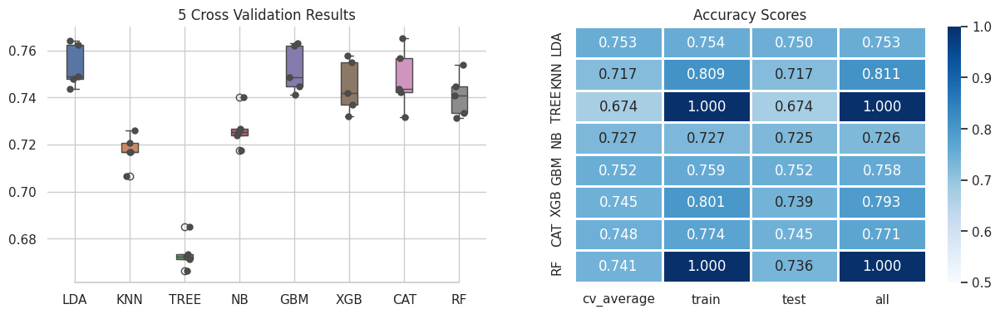

In [21]:
modelEval(df_tr,split_id=[0.2,None],plot_id=[False,True])

In [36]:
df_tr.info()

<class 'pandas.core.frame.DataFrame'>
Index: 39895 entries, 2022.11.30 23:58 to 2023.01.11 02:50
Data columns (total 27 columns):
 #   Column  Non-Null Count  Dtype  
---  ------  --------------  -----  
 0   Open    39895 non-null  float64
 1   High    39895 non-null  float64
 2   Low     39895 non-null  float64
 3   Close   39895 non-null  float64
 4   Volume  39895 non-null  float64
 5   mom0    39895 non-null  float64
 6   mom1    39895 non-null  float64
 7   mom2    39895 non-null  float64
 8   rsi0    39895 non-null  float64
 9   rsi1    39895 non-null  float64
 10  rsi2    39895 non-null  float64
 11  sth0k   39895 non-null  float64
 12  sth1k   39895 non-null  float64
 13  sth2k   39895 non-null  float64
 14  sth0d   39895 non-null  float64
 15  sth1d   39895 non-null  float64
 16  sth2d   39895 non-null  float64
 17  ema0    39895 non-null  float64
 18  ema1    39895 non-null  float64
 19  ema2    39895 non-null  float64
 20  tema0   39895 non-null  float64
 21  tema1   39895 

In [ ]:
df_tr = df_tr.drop(columns=['Open', 'High', 'Low', 'Close', 'Volume', 'ema0', 'ema1', 'ema2', 'tema0', 'tema1', 'tema2', 'ama0', 'ama1', 'ama2'])

Evaluation Function
Cross Validation Activated, n_splits : 5, scoring metric: accuracy
Train/Evaluation Set Spit Activated: 0.2

Using Features: Index(['Open', 'High', 'Low', 'Close', 'Volume', 'mom0', 'mom1', 'mom2',
       'rsi0', 'rsi1', 'rsi2', 'sth0k', 'sth1k', 'sth2k', 'sth0d', 'sth1d',
       'sth2d', 'ema0', 'ema1', 'ema2', 'tema0', 'tema1', 'tema2', 'ama0',
       'ama1', 'ama2'],
      dtype='object')
Target Variable: Result

LDA : 0.755(0.009) -> 0.53s | 0.757 & 0.750 -> 0.15s | 0.756 -> 0.15s
KNN : 0.713(0.007) -> 7.60s | 0.811 & 0.716 -> 9.41s | 0.813 -> 1.2e+01s
TREE : 0.671(0.012) -> 7.69s | 1.000 & 0.669 -> 1.74s | 1.000 -> 2.3s
NB : 0.724(0.010) -> 0.17s | 0.727 & 0.722 -> 0.05s | 0.726 -> 0.05s
GBM : 0.747(0.010) -> 72.27s | 0.763 & 0.741 -> 17.67s | 0.761 -> 2.3e+01s
XGB : 0.733(0.012) -> 3.08s | 0.844 & 0.717 -> 0.75s | 0.829 -> 0.83s
CAT : 0.733(0.010) -> 6.18s | 0.805 & 0.712 -> 0.98s | 0.798 -> 1.2s
RF : 0.734(0.010) -> 52.44s | 1.000 & 0.728 -> 13.98s | 1.000 ->

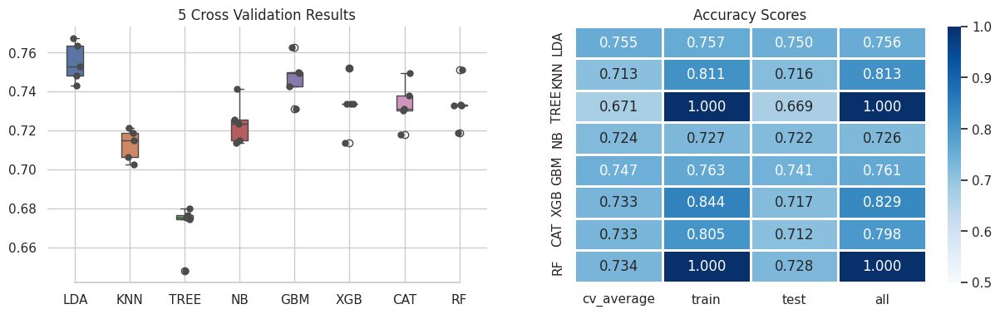

In [37]:
modelEval(df_tr,split_id=[0.2,None],plot_id=[False,True])